# Data Visualization Project: Books about US Politics

<p><b> Lorenzo Baglini, Edoardo Borriello, Filippo Piccaro</b><p>

    
In this file we have collected everything we have obtained from our analyses, both our assumptions and our results, our codes and our graphical representations. 
Initially we had decided to select from this site http://www-personal.umich.edu/~mejn/netdata/ the dataset that we found in this link http://snap.stanford.edu/data/ and took the one related to California roads that can be viewed at this link http://snap.stanford.edu/data/roadNet-CA.html. Unfortunately due to the size of the dataset and the computational limits of our computers we decided to change our dataset, also because the one initially chosen did not offer additional data to carry out an effective and deep analysis.

We, therefore, opted for the BOOKS ABOUT US POLITICS dataset (http://www-personal.umich.edu/~mejn/netdata/polbooks.zipper ). Taking the site description it represents "A network of books on US politics published around the time of the 2004 presidential election and sold by the online bookseller Amazon.com. The borders between the books represent frequent joint purchases of books by the same buyers". It consists, then, of a graphical representation of a network based on Amazon's recommendation system. The file obtained from that link has the extension gml: we therefore decided to process and analyze it on Jupyter Notebook.

We focused on the technical analysis of the graph, trying also to extrapolate some information and values interpretable also thanks to the use of external data.
We also decided to compare the predictive ability of the modular algorithm for community prediction with the divisions (communities) previously given by the file.

a) The first thing we did was to import the libraries we needed. In order we used:
- "import networkx as nx" for graph representation and analysis.
- "import pandas as pd" to work with dataframes, fundamental for data collection and processing.
- "import numpy as np" to use additional mathematical tools.
- "from matplotlib import pyplot as plt" as a library for visualization and graph creation.
- "import seaborn as sns" as a package to extend the graphing functions.
- "import random" to get random seeds.
- "from networkx.algorithms import community" to use the community predictive algorithm.
- Finally we imported these libraries that we will need for some graphical functions: "from itertools import chain, import plotly.express as px, import plotly.graph_objs as go, import plotly.offline as pyo".

In [2]:
#importing the necessary libraries
%matplotlib inline 
import networkx as nx
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
import random
from networkx.algorithms import community
from itertools import chain
import plotly.express as px
import plotly.graph_objs as go
import plotly.offline as pyo

b) Next, we extracted the nodes and all the edges and put them into lists with the number of elements for each one.

In [3]:
#Reading the dataset and exporting its data as G
G= nx.read_gml(path="polbooks.gml")

#creating nodes and edges list with relative lenght in order to use them later
listnode=list(G)
print(listnode)
print(' ')
print('Numbers of nodes: ',len(listnode))
print('')
listedge=list(G.edges())
print(listedge)
print(' ')
print('Numbers of edges: ',len(listedge))

['1000 Years for Revenge', 'Bush vs. the Beltway', "Charlie Wilson's War", 'Losing Bin Laden', 'Sleeping With the Devil', 'The Man Who Warned America', 'Why America Slept', 'Ghost Wars', 'A National Party No More', 'Bush Country', 'Dereliction of Duty', 'Legacy', 'Off with Their Heads', 'Persecution', "Rumsfeld's War", 'Breakdown', 'Betrayal', 'Shut Up and Sing', 'Meant To Be', 'The Right Man', 'Ten Minutes from Normal', "Hillary's Scheme", 'The French Betrayal of America', 'Tales from the Left Coast', 'Hating America', 'The Third Terrorist', 'Endgame', 'Spin Sisters', "All the Shah's Men", 'Dangerous Dimplomacy', 'The Price of Loyalty', 'House of Bush, House of Saud', 'The Death of Right and Wrong', 'Useful Idiots', "The O'Reilly Factor", 'Let Freedom Ring', 'Those Who Trespass', 'Bias', 'Slander', 'The Savage Nation', 'Deliver Us from Evil', 'Give Me a Break', 'The Enemy Within', 'The Real America', "Who's Looking Out for You?", 'The Official Handbook Vast Right Wing Conspiracy', 'Po

c) We proceeded to an initial representation of the graph using networkx.

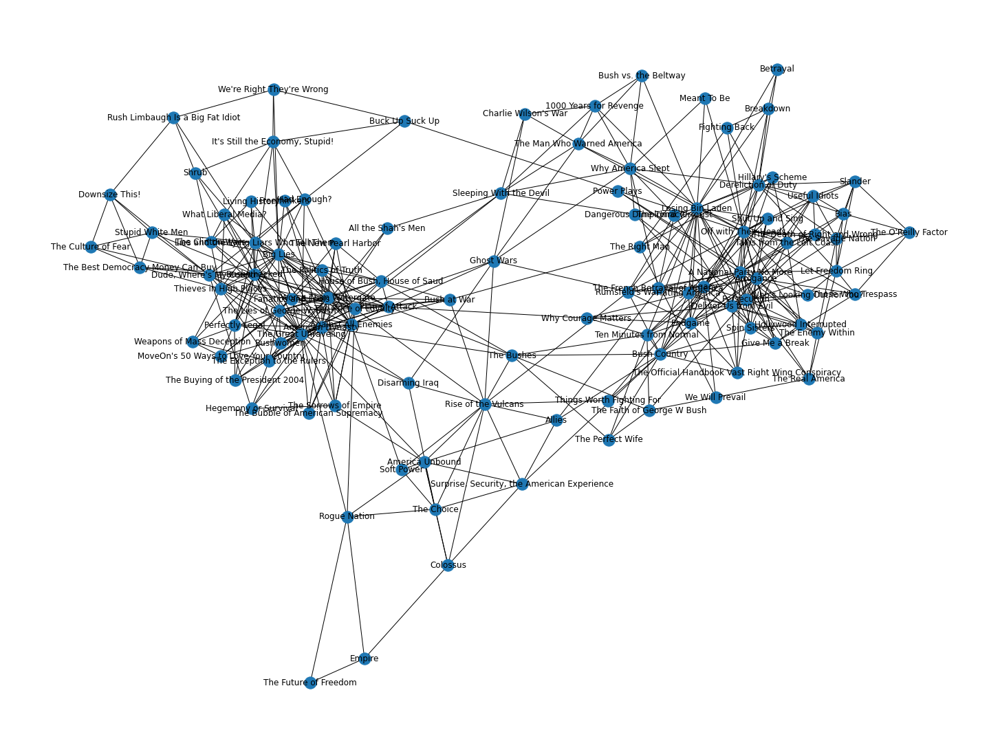

In [4]:
#Create a first graphical rapresentation of the graph
np.random.seed(34) 
plt.figure(figsize=(20,15))
nx.draw(G, with_labels=True)

From this representation we have immediately noticed a polarization of the nodes that in the majority of the representations naturally tend to dispose themselves in two distinguished groups.

d) We finally extracted some data needed for the generic analysis of the graph and plotted them in a dataframe

In [5]:
#Extracting some usefull information about our graph

#number of nodes
numbernodes=len(listnode)

#number of edges
numberedges=len(listedge)

#Give the Diamenter of G
diameter=nx.diameter(G)

#Give bool if bipartite or not
bipartite=nx.is_bipartite(G)

#Give bool if directed or not
directed=nx.is_directed(G)

#Give bool if connected or not
connected=nx.is_connected(G)

#Give bool if biconnected or not
biconnected=nx.is_biconnected(G)

#Give the average degree 
avg_degree=(sum(dict(G.degree()).values()) / nx.number_of_nodes(G))/2

#Give average clustering
avg_clust=nx.average_clustering(G)

#Give average short path
avg_short_path=nx.average_shortest_path_length(G)

#Give density
density=nx.density(G)

#Give number of components of G (if connected True, this is always 1)
n_connect_comp=nx.number_connected_components(G)

#Create the DataFrame with all the data
index=['number of nodes', 'number of edges', 'diameter', 'bipartite', 'directed', 'connected', 'biconnected', 'average degree', 'average clustering coefficient', 'average short path length', 'density', 'number connected component']
value=[ numbernodes, numberedges , diameter, bipartite, directed, connected, biconnected, avg_degree, avg_clust, avg_short_path, density, n_connect_comp]
columns=['values of G']
df_data_G=pd.DataFrame(data=value, index=index, columns=columns, dtype=None, copy=None)
df_data_G

,values of G
number of nodes,105
number of edges,441
diameter,7
bipartite,False
directed,False
connected,True
biconnected,True
average degree,4.2
average clustering coefficient,0.487527
average short path length,3.078755


The synthesized information about our graph allows us to analyze all of its various aspects in depth.

To begin, we can see that the total 105 nodes are arranged in such a way as to form a graph with a diameter of 7. We believe we can consider this value normal because it is neither too low nor too high for a graph formed by 441 links. So, given the number of the edges and the number of the nodes, we can obtain an average degree of 4.2 that is simply the relationship, respectively, between them.

The following information gives us more insight into the structure of our network. First, we avoid the formation of several subsets since our graph is not bipartite. As a consequence, we know that the number of connected components is 1. Then, knowing that our network is not formed by directed edges, we can deduce that it is connected. Finally, we find that the graph in question is also biconnected, i.e., it contains at least one node removed from which the graph would no longer be connected.

The average clustering coefficient is a property of a node in a network and it explains how well connected the neighborhood of the node is. If the neighborhood is fully connected, the clustering coefficient is 1 and a value close to 0 means that there are hardly any connections in the neighborhood.	In our case, we have 0.487527 as average clustering coefficient, so we are in the middle.

Moving on, we have found 3.078755 as a value for our average shortest-path length, that is defined as the average number of steps along the shortest paths for all possible pairs of network nodes. It measures the efficiency of mass transport on a network and we think is fitting with our expectations.

Finally, the graph density represents the ratio between the edges present in a graph and the maximum number of edges that the graph can contain. Our graph has a density of 0.080769 and we can say that it is not very dense.

The number of connected components are 1 as we expected from the result of the connected value "True".

## <p>2. Creating a DataFrame with all the data we need<p>
    
At this stage we decided to extract all necessary data from graph and plotted them in a dataframe    


a) First, we extracted the hidden values associated with each node: in addition to the information about nodes and edges, within the file, each node was associated with a letter (''l'' for liberal, ''n'' for neutral and ''c'' for conservative) that corresponds to the generic political orientation of the book. These values were given by the author of the dataset based on the content of the books themselves.

In [6]:
#creating list of all hidden values of the nodes of 
listvalue=[]
for i in listnode:
    a=G.nodes[i]['value']
    listvalue.append(a)

#creting a dataframe where to host all the data of the Graph
data={'nodes':listnode,'values':listvalue,'node':listnode}
df=pd.DataFrame(data=data )
df.set_index('nodes', inplace = True)
df

,values,node
nodes,,
1000 Years for Revenge,n,1000 Years for Revenge
Bush vs. the Beltway,c,Bush vs. the Beltway
Charlie Wilson's War,c,Charlie Wilson's War
Losing Bin Laden,c,Losing Bin Laden
Sleeping With the Devil,n,Sleeping With the Devil
...,...,...
Thieves in High Places,l,Thieves in High Places
Shrub,l,Shrub
Buck Up Suck Up,l,Buck Up Suck Up


This is the base dataframe to which we will add all the data extracted later.

b) Next, we associated each hidden value with a color (blue for liberals, gray for neutrals, and red for conservatives. These values were added to our dataframe. We also proceeded to create a representation of the graph where the nodes are of their associated color.

,values,colors,node
nodes,,,
1000 Years for Revenge,n,grey,1000 Years for Revenge
Bush vs. the Beltway,c,red,Bush vs. the Beltway
Charlie Wilson's War,c,red,Charlie Wilson's War
Losing Bin Laden,c,red,Losing Bin Laden
Sleeping With the Devil,n,grey,Sleeping With the Devil
...,...,...,...
Thieves in High Places,l,blue,Thieves in High Places
Shrub,l,blue,Shrub
Buck Up Suck Up,l,blue,Buck Up Suck Up


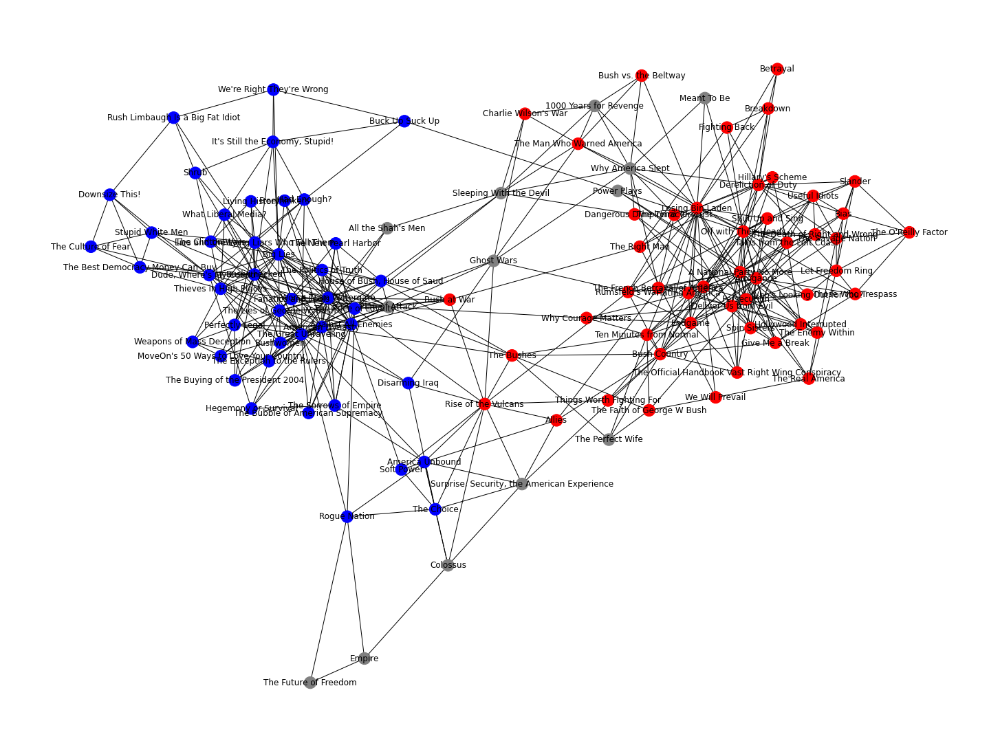

In [7]:
#creating a list of colours associated to the values and added to the dataframe
colors=[]
for i in listnode:
    if df['values'][i]=='n':
        c='grey'
        colors.append(c)
    elif df['values'][i]=='l':
        c='blue'
        colors.append(c)
    else:
        c='red'
        colors.append(c)    
df.insert(1, 'colors', colors)

#creating the graph with the updaated colors
np.random.seed(34) 
plt.figure(figsize=(20,15))
nx.draw(G,with_labels=True, node_color=colors )
df

This representation indeed seems to confirm our previous assumption regarding the polarization of the graph nodes. Logically, since the theme of the books is politics, a reader will tend to purchase books with related political ideologies and this could explain such "polarization".

c) We then proceeded to add all the other key indicators related to the nodes in the dataframe.

In [8]:
#Lets take all the degrees and add them to the df
degrees=[]
for i in G.nodes():
    degrees.append(G.degree(i))
df.insert(0, 'degree', degrees)


#Lets take the Degree centrality of all the nodes and add them to the df
deg_cen_G = nx.degree_centrality(G)
listdegcen=[]
for i in listnode:
    a=deg_cen_G[i]
    listdegcen.append(a)
df.insert(1, 'degree centrality', listdegcen)


#Lets take the Beetweenes centrality of all the nodes and add them to the df
bw_centrality_G = nx.betweenness_centrality(G, normalized=False)
listbwcen=[]
for i in listnode:
    a=bw_centrality_G[i]
    listbwcen.append(a)
df.insert(2, 'betweenness centrality', listbwcen)


#Lets get the eccentricity of each node and add it to the df
eccentricity=nx.eccentricity(G)
listeccen=[]
for i in listnode:
    a=eccentricity[i]
    listeccen.append(a)
df.insert(3, 'eccentricity', listeccen)

#Lets get the Clustering coefficient of all nodes and add it to the df
clustering=nx.clustering(G)
listclust=[]
for i in listnode:
    a=clustering[i]
    listclust.append(a)
df.insert(4, 'Clustering coefficient', listclust)

#Lets get the Closeness centrality of all nodes and add it to the df
clos = nx.closeness_centrality(G)
listclos=[]
for i in listnode:
    a=clos[i]
    listclos.append(a)
df.insert(5, 'closeness centrality', listclos)


##Lets get the Eigenvector centrality
egs = nx.eigenvector_centrality(G,  max_iter=600)
listegs=[]
for i in listnode:
    a=egs[i]
    listegs.append(a)
df.insert(6, 'Eigenvector centrality', listegs)

#recall the dataframe to see the total result
df

,degree,degree centrality,betweenness centrality,eccentricity,Clustering coefficient,closeness centrality,Eigenvector centrality,values,colors,node
nodes,,,,,,,,,,
1000 Years for Revenge,6,0.057692,39.811624,4,0.600000,0.345515,0.016812,n,grey,1000 Years for Revenge
Bush vs. the Beltway,4,0.038462,0.261957,5,0.833333,0.303207,0.012289,c,red,Bush vs. the Beltway
Charlie Wilson's War,4,0.038462,2.789044,5,0.666667,0.309524,0.011851,c,red,Charlie Wilson's War
Losing Bin Laden,23,0.221154,407.553616,5,0.209486,0.371429,0.077091,c,red,Losing Bin Laden
Sleeping With the Devil,8,0.076923,337.044879,4,0.250000,0.390977,0.046648,n,grey,Sleeping With the Devil
...,...,...,...,...,...,...,...,...,...,...
Thieves in High Places,12,0.115385,38.128191,6,0.333333,0.294618,0.157542,l,blue,Thieves in High Places
Shrub,5,0.048077,5.049037,6,0.500000,0.285714,0.062451,l,blue,Shrub
Buck Up Suck Up,4,0.038462,219.569294,4,0.333333,0.329114,0.019691,l,blue,Buck Up Suck Up


In creating our dataframe, we decided to include all the variables related to a graph that can allow us to conduct a  more accurate analysis.

First, we added the nodes, taken one by one with respective values for each variable examined.

Regarding the variables, we have chosen to take the number of degrees, the degree centrality, the betweenness centrality, the eccentricity, the clustering coefficient, the closeness centrality, the eigenvector centrality and, lastly, the genre it belongs to (neutral, conservative or liberal) and the color with which it is displayed in our charts.

The degree of a node is the number of connections that it has to other nodes in the network while the degree centrality of a node is simply the ratio between the number of edges it has and the total number of nodes. The higher the degree centrality, the more central the node is.

Betweenness centrality is a way of detecting the amount of influence a node has over the flow of information in a graph. It is often used to find nodes that serve as a bridge from one part of a graph to another.

The eccentricity of a node in a graph is defined as the length of a longest shortest path starting that node.

The clustering coefficient of a node in a graph quantifies how close its neighbours are to being a complete graph.

Closeness centrality is the shortest path between a node and all other reachable nodes. It measures how long it will take information to spread from a given node to other nodes in the network.

Eigenvector centrality measures the influence of a node in a network. Relative scores are assigned to all nodes in the network based on the concept that connections to high-scoring nodes contribute more to the score of the node in question than equal connections to low-scoring nodes.

d) As the last action of this phase we created a dataframe with the betweness of all possible paths between nodes.

In [9]:
path_l = dict(nx.shortest_path_length(G))
path_tuple = [] 
for k, v in path_l.items():
    for h, vv in v.items(): 
        path_tuple.append((k, h, vv))
path_df = pd.DataFrame(path_tuple, columns = ['NodeA', 'NodeB', 'Betweeness'])
path_df

,NodeA,NodeB,Betweeness
0,1000 Years for Revenge,1000 Years for Revenge,0
1,1000 Years for Revenge,Bush vs. the Beltway,1
2,1000 Years for Revenge,Sleeping With the Devil,1
3,1000 Years for Revenge,Charlie Wilson's War,1
4,1000 Years for Revenge,The Man Who Warned America,1
...,...,...,...
11020,Empire,Hollywood Interrupted,5
11021,Empire,Slander,5
11022,Empire,Let Freedom Ring,5
11023,Empire,Bias,5


### <p>2.1 All our data grouped in three dataframes<p>
 
    
Here we decided to recall all the dataframes created to have them all in a concentrated area, so that they can be consulted more efficiently. In order we have:
- df_data_G which represents the general data of the graph.
- path_df represents all possible paths in our graph with relative betweeness.
- df represents data about each individual node.


In [10]:
#some data on the Graph
df_data_G

,values of G
number of nodes,105
number of edges,441
diameter,7
bipartite,False
directed,False
connected,True
biconnected,True
average degree,4.2
average clustering coefficient,0.487527
average short path length,3.078755


In [11]:
#all possible path
path_df

,NodeA,NodeB,Betweeness
0,1000 Years for Revenge,1000 Years for Revenge,0
1,1000 Years for Revenge,Bush vs. the Beltway,1
2,1000 Years for Revenge,Sleeping With the Devil,1
3,1000 Years for Revenge,Charlie Wilson's War,1
4,1000 Years for Revenge,The Man Who Warned America,1
...,...,...,...
11020,Empire,Hollywood Interrupted,5
11021,Empire,Slander,5
11022,Empire,Let Freedom Ring,5
11023,Empire,Bias,5


In [12]:
df

,degree,degree centrality,betweenness centrality,eccentricity,Clustering coefficient,closeness centrality,Eigenvector centrality,values,colors,node
nodes,,,,,,,,,,
1000 Years for Revenge,6,0.057692,39.811624,4,0.600000,0.345515,0.016812,n,grey,1000 Years for Revenge
Bush vs. the Beltway,4,0.038462,0.261957,5,0.833333,0.303207,0.012289,c,red,Bush vs. the Beltway
Charlie Wilson's War,4,0.038462,2.789044,5,0.666667,0.309524,0.011851,c,red,Charlie Wilson's War
Losing Bin Laden,23,0.221154,407.553616,5,0.209486,0.371429,0.077091,c,red,Losing Bin Laden
Sleeping With the Devil,8,0.076923,337.044879,4,0.250000,0.390977,0.046648,n,grey,Sleeping With the Devil
...,...,...,...,...,...,...,...,...,...,...
Thieves in High Places,12,0.115385,38.128191,6,0.333333,0.294618,0.157542,l,blue,Thieves in High Places
Shrub,5,0.048077,5.049037,6,0.500000,0.285714,0.062451,l,blue,Shrub
Buck Up Suck Up,4,0.038462,219.569294,4,0.333333,0.329114,0.019691,l,blue,Buck Up Suck Up


## <p>3. Plotting some data<p>
 

Here we proceeded to create some graphs and charts with the data obtained to get a clearer idea and to be able to contextualize our results.

a) First, we created an adjacency matrix to visualize the links between nodes. Given the size of the dataset we opted for an interactive representation using plotly: each pixel of the matrix corresponds to a pair of nodes, the yellow ones represent the edges. Moving the cursor over the matrix a pop-up will appear in correspondence of the pixel with the information related to a couple of nodes.

In [13]:
#Adjacency matrix 
fig = px.imshow(nx.adjacency_matrix(G).todense(),  x = df.index, y =df.index)
fig.show()

b) We also decided to create two graphs using Seaborn: a Countplot and a distribution plot thanks to which we were able to represent the degrees for each node. We can see how the two graphs, even if they represent the same thing, naturally differ in the way of representing the data.<p>

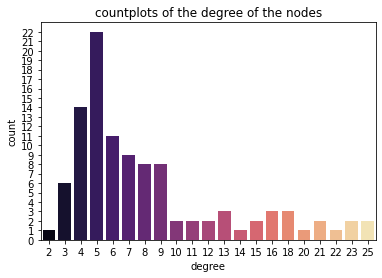

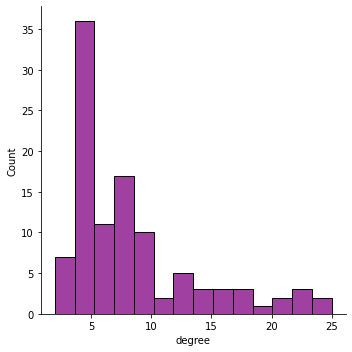

In [14]:
#lets plot the degree
ax1=sns.countplot(x=df['degree'], palette='magma')
ax1.set_ylim(0,23)
ax1.set_yticks(range(0,23))
ax1.set_title('countplots of the degree of the nodes')
ax2=sns.displot(x=df['degree'], color='Purple')


c) These are two plots made with plotly. The first one is an interactive version of the previous ones, the second, instead, is an interactive scatterplot in which we have inserted the degree and the rank of the nodes. In order to realize them we have used two functions defined by the professor in class.

The function created by the professor.

In [15]:
#Using professor script in order to create plots for the rank and degree of  our graph in plotly
def degree_rank(net):
    degree_sequence = sorted((d for n, d in net.degree()), reverse=True)
    df = pd.DataFrame(degree_sequence, columns = ['Degree'])
    fig = px.scatter(df, y = 'Degree')
    fig.update_layout(xaxis_title="Rank")
    return fig

def degree_hist(net, kind = None, group = False):
    if kind == 'in':  degrees = net.in_degree()
    elif kind == 'out':  degrees = net.out_degree()
    else: degrees = net.degree()
   
    df = pd.DataFrame(degrees, columns = ['Node', 'Degree'])
    nbins = None if group else len(degrees)
    fig = px.histogram(df, x="Degree", nbins = nbins )
    fig.update_layout(yaxis_title="# of Nodes", bargap=0.01)
    return fig  

The obtained plots.

In [16]:
#degree of each node with plotly
degree_hist(G).show()
#rank of each node with plotly
degree_rank(G).show() ##cambiare index punti##

d) Here we have graphically represented our network by dividing the 3 categories present by color: liberal-blue, conservative-red and neutral-gray and using two different visualization models: the first circular to highlight the connections between the nodes and the other a Kamada Kawai,a force-directed algorithm, to make more tangible the subdivision of the different categories visible. We opted for a Kamada-kawai layout for all the folliwing graphs in order to conduct a better exposition of the analysis and have 
give a points of reference to the reader.

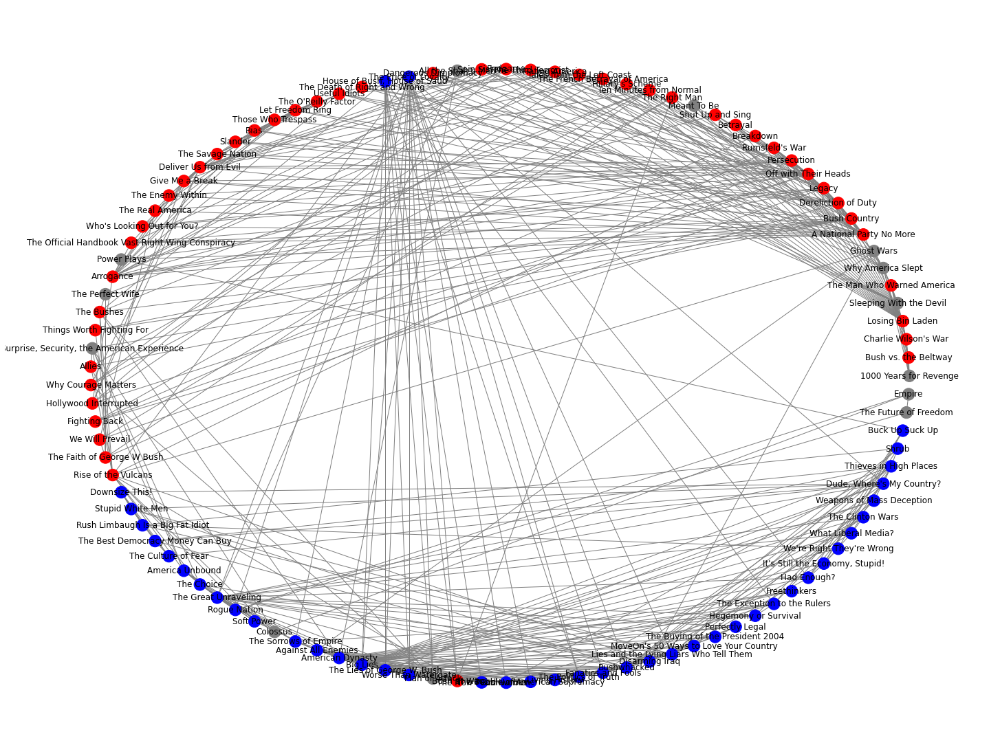

In [17]:
#apply a circular layout
plt.figure(figsize=(20,15))
a=nx.draw_circular(G, with_labels=True, node_color = colors,  edge_color = "grey")

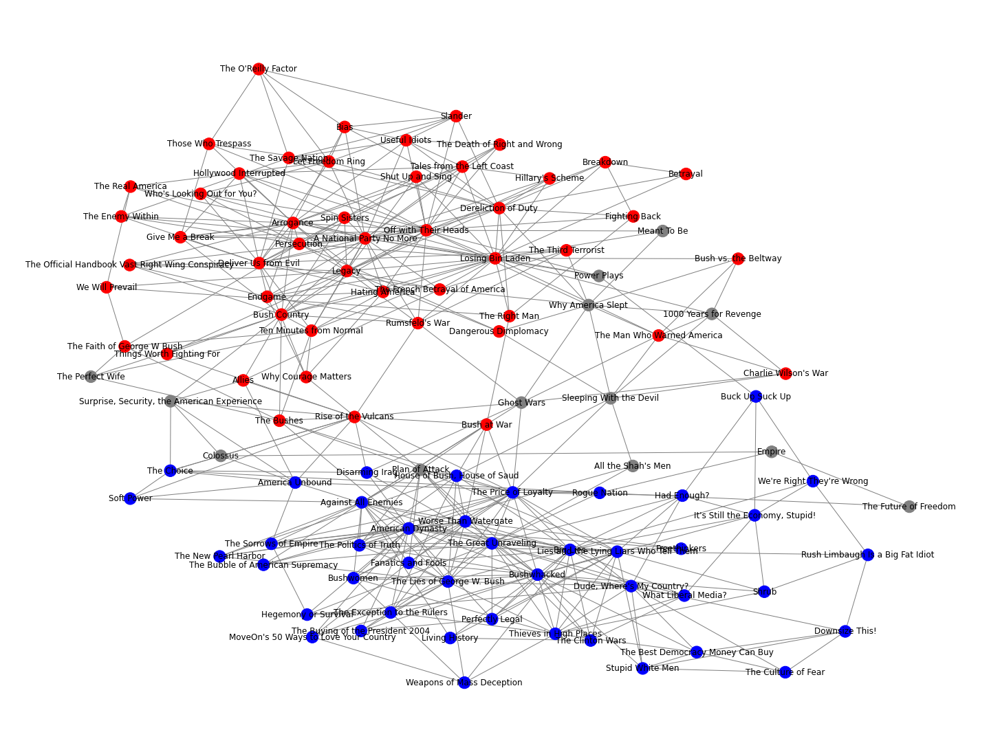

In [18]:
# apply a Kamada-Kawai force-directed layout
np.random.seed(34)
plt.figure(figsize=(20,15))
nx.draw_kamada_kawai(G, with_labels=True, node_color = colors,  edge_color = "grey")

e) At this stage we conducted a graphical analysis of all the indicators previously collected in the dataframe. To do this we created a network with Networkx, in which each node changes in size and color according to the incidence of the value. We matched each of them with an interactive barplot with the 10 books possessing the highest values, all created thanks to plotly. We have plotted:
- The degree
- The betweenness centrality
- The degree centrality
- The closeness centrality
- The eigenvector centrality
- The cluster coefficient


We used this defined function to get the ten highest values for each variable.

In [19]:
#plotting some of the data on the graph
def get_top_keys(df, column, top):
    return df.sort_values(column, ascending = False).head(top)['node'].tolist()

* Here we focus on the degree, which represent the number of neighbours of the node.

Top 10 by degree  ['A National Party No More', 'Off with Their Heads', 'Losing Bin Laden', 'Bushwhacked', 'American Dynasty', 'The Great Unraveling', 'Big Lies', 'The Price of Loyalty', 'Legacy', 'Arrogance']


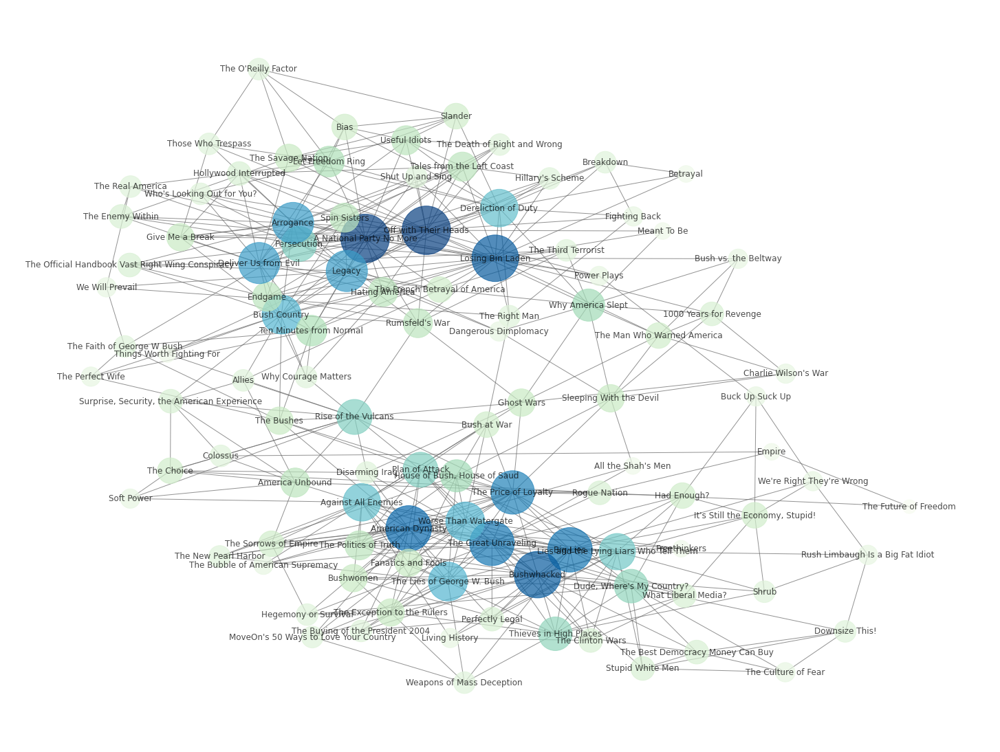

In [20]:
#lets plot the network where the nodes have the color and dimension which depends on the degree
np.random.seed(34)
plt.figure(figsize=(20,15))
node_color5= degrees
nodesize5=[200*v for v in degrees]
nx.draw_kamada_kawai(G, node_size=nodesize5 , node_color=node_color5, alpha=0.7, with_labels=True, edge_color='0.4', cmap=plt.cm.GnBu)

top10degree=get_top_keys(df, 'degree', 10)
print('Top 10 by degree ', top10degree) 

As we can see, the two books with higher degrees are: "A National Party No More" and "Off with Their Heads" with a value of 25. Thanks to the Graph we can also observe which books are most connected with each other within our dataset: the ones with higher degree  are concentrated in two points, in the center of the two main groups that have been formed. In fact we can interpret this as the two sub-groups of the graph have more influential books with more connections than the others, obviously arranged in the centers.

In [21]:
df_Cluc = df.sort_values('degree', ascending=False).head(10)
fig = px.bar(df_Cluc, x = 'node', y = 'degree',color='degree' , color_continuous_scale=px.colors.sequential.GnBu)
fig.show()

* Here we focus on the degree centrality, which it give us the same information of the previuos analysis. 

Top 10 by Degree centrality  ['A National Party No More', 'Off with Their Heads', 'Losing Bin Laden', 'Bushwhacked', 'American Dynasty', 'The Great Unraveling', 'Big Lies', 'The Price of Loyalty', 'Legacy', 'Arrogance']


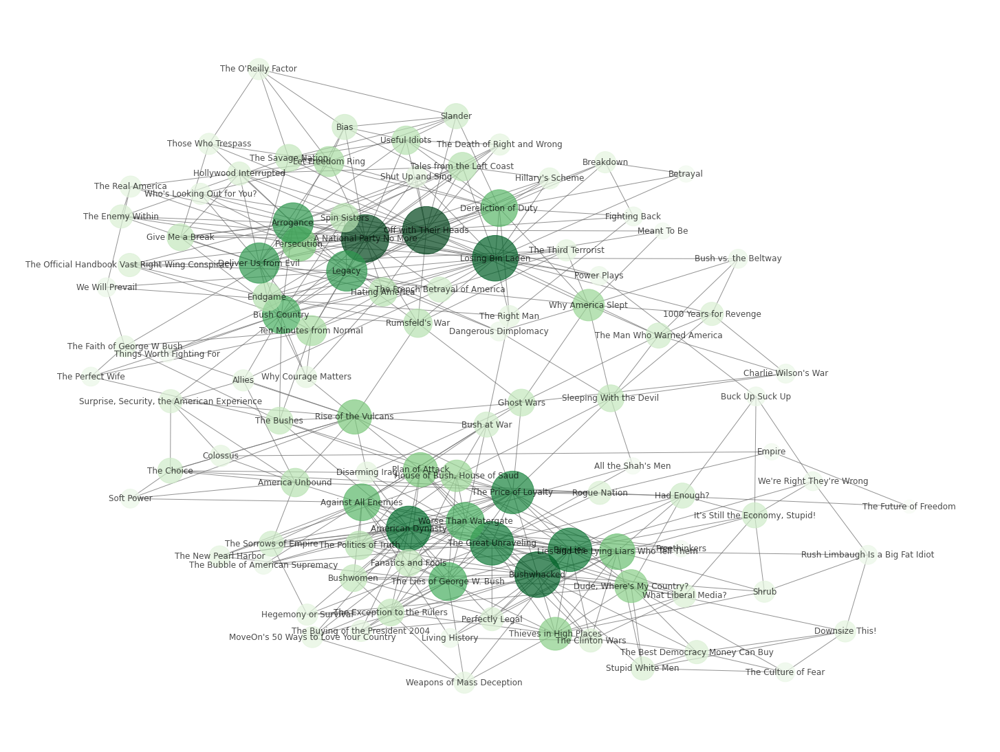

In [22]:
# lets plot the network where the nodes have the size and color which depends on the degree centrality
np.random.seed(34)
plt.figure(figsize=(20,15))
node_color1 = listdegcen
node_size1 = [20000*v for v in listdegcen]
nx.draw_kamada_kawai(G, node_size=node_size1, node_color=node_color1, alpha=0.7, with_labels=True, edge_color='0.4', cmap=plt.cm.Greens)

top10degcen=get_top_keys(df, 'degree centrality', 10)
print('Top 10 by Degree centrality ', top10degcen)

In [23]:
df_dc = df.sort_values('degree centrality', ascending=False).head(10)
fig = px.bar(df_dc, x = 'node', y = 'degree centrality',color="degree centrality", color_continuous_scale=px.colors.sequential.Greens)
fig.show()

* Here we focus on the betweenness centrality, it mesures the extent to which a vertex lies on paths between other vertices

Top 10 by betweenness centrality  ['The Price of Loyalty', 'The Bushes', 'Bush Country', 'Off with Their Heads', 'American Dynasty', 'Plan of Attack', 'Losing Bin Laden', 'Rise of the Vulcans', 'A National Party No More', 'Ghost Wars']


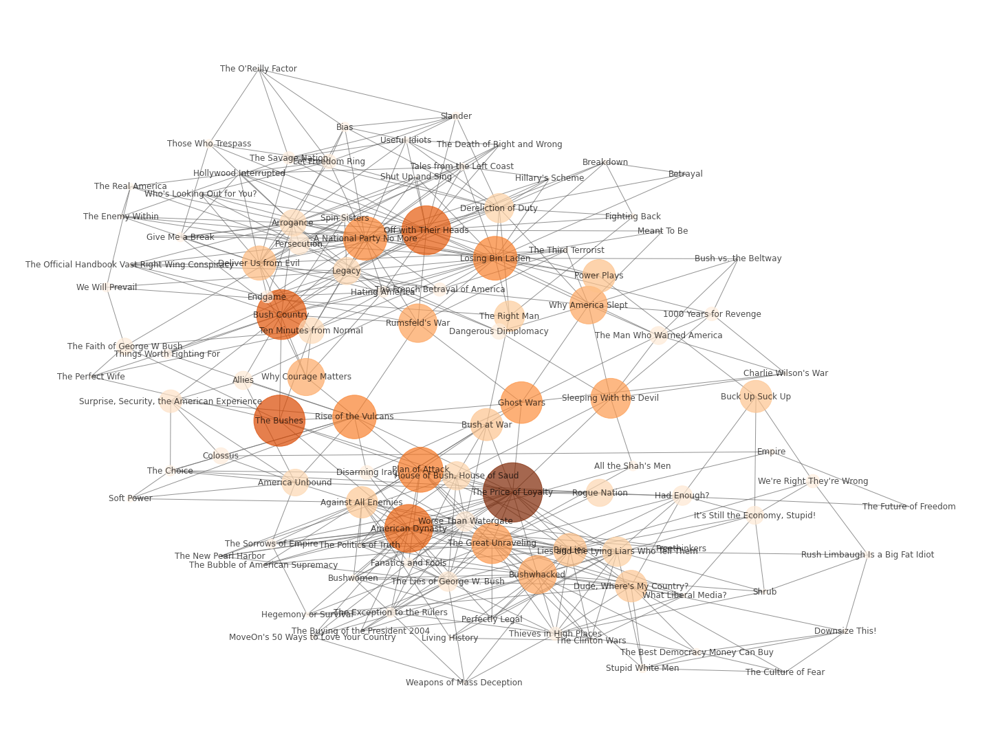

In [24]:
# lets plot the network where the nodes have a color intensity beased on the betweennes centrality

np.random.seed(34)
plt.figure(figsize=(20,15))
node_color = np.fromiter(listbwcen, float)
node_size = [10*v for v in listbwcen]
nx.draw_kamada_kawai(G, node_color=node_color,node_size=node_size, alpha=0.7, with_labels=True, edge_color='0.4', cmap=plt.cm.Oranges)

top10bwcen=get_top_keys(df, 'betweenness centrality', 10)
print('Top 10 by betweenness centrality ', top10bwcen)

In this case the books with greater degree centrality are: "The Price of Loyalty" and "The Bushes". Thanks to this we can understand how and how much each book can be related to the others and potentially be bought by different buyers acting as a link between different paths: moreover from the graph we can see that there's a concentration of nodes in the center of the network. This can be explained by the fact that those books are the one more likely to be bought by both the the two main political movement and/or by the neutrals.

In [25]:
df_bc = df.sort_values('betweenness centrality', ascending=False).head(10)
fig = px.bar(df_bc, x = 'node', y = 'betweenness centrality',color="betweenness centrality", color_continuous_scale=px.colors.sequential.Oranges)
fig.show()

* Here we focus on the Closeness centrality, which represent the mean distance from a vertex to other vertices.

Top 10 by Closeness centrality  ['The Price of Loyalty', 'Rise of the Vulcans', 'The Bushes', 'Ghost Wars', 'Bush Country', 'Plan of Attack', "Rumsfeld's War", 'American Dynasty', 'Sleeping With the Devil', 'House of Bush, House of Saud']


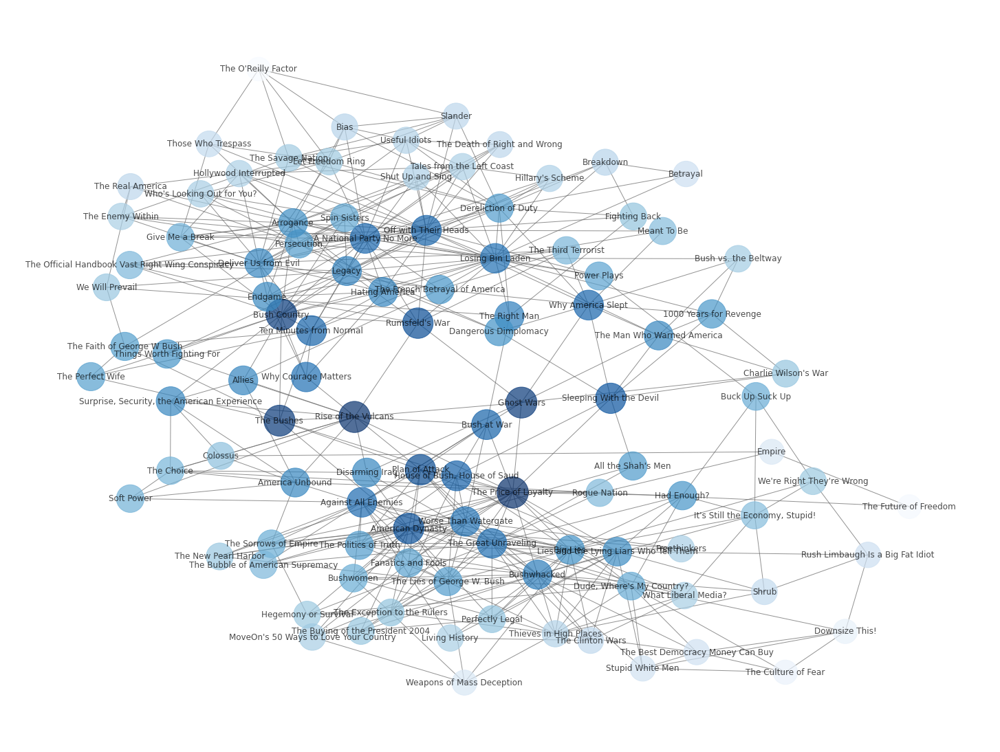

In [26]:
#lets plot the network where the nodes have the color and dimension which depends on the closeness centrality
np.random.seed(34)
plt.figure(figsize=(20,15))
node_color2 = listclos
nodesize2=[5000*v for v in clos.values()]
nx.draw_kamada_kawai(G, node_color=node_color2,node_size=nodesize2, alpha=0.7, with_labels=True, edge_color='0.4', cmap=plt.cm.Blues)

top10closcen=get_top_keys(df, 'closeness centrality', 10)
print('Top 10 by Closeness centrality ', top10closcen)

We can also note both from the graph and from the barplot that this value tends to be similar for most of the books.

In [27]:
df_cc = df.sort_values('closeness centrality', ascending=False).head(10)
fig = px.bar(df_cc, x = 'node', y = 'closeness centrality', color="closeness centrality", color_continuous_scale=px.colors.sequential.Blues)
fig.show()

* Here we focus on the eigenvector, which is a measure of the influence of a node in a network.

Top 10 by Eigenvector centrality  ['Bushwhacked', 'Big Lies', 'American Dynasty', 'The Price of Loyalty', 'The Great Unraveling', 'The Lies of George W. Bush', 'Worse Than Watergate', 'Plan of Attack', 'Lies and the Lying Liars Who Tell Them', 'Against All Enemies']


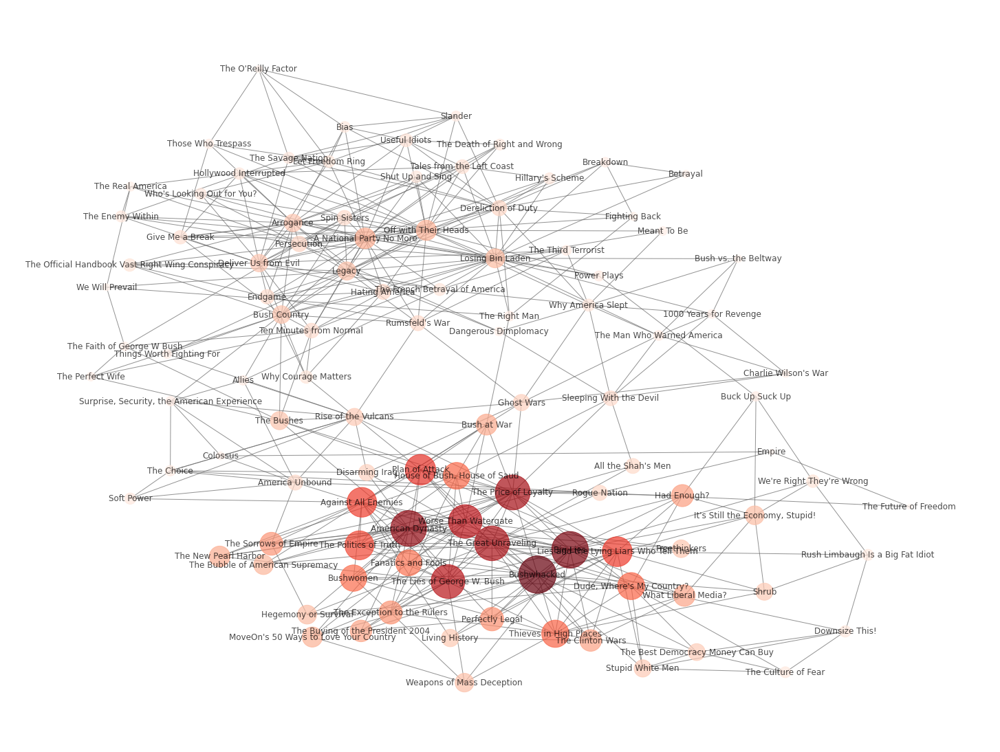

In [28]:
#lets plot the network where the nodes have the color and dimension which depends on the Eigenvector centrality
np.random.seed(34)
plt.figure(figsize=(20,15))
node_color3 = listegs
nodesize3=[10000*v for v in listegs]
nx.draw_kamada_kawai(G, node_size=nodesize3 , node_color=node_color3, alpha=0.7, with_labels=True, edge_color='0.4', cmap=plt.cm.Reds)

top10eigvectcen=get_top_keys(df, 'Eigenvector centrality', 10)
print('Top 10 by Eigenvector centrality ',top10eigvectcen)

The two with greater values are "Bushwhacked" and "Big Lies" while we can easily see from the graph how the greater values are present in the lower part, the one relating to the books of liberal current.

In [29]:
df_ec = df.sort_values('Eigenvector centrality', ascending=False).head(10)
fig = px.bar(df_ec, x = 'node', y = 'Eigenvector centrality', color="Eigenvector centrality", color_continuous_scale=px.colors.sequential.Reds)
fig.show()

* Here we focus on the clustering coefficient which is a measure of the degree to which nodes in a graph tend to cluster together. 

Top 10 by Clustering coefficient  ['The Future of Freedom', 'The Culture of Fear', 'Betrayal', 'Freethinkers', 'The Buying of the President 2004', 'Shut Up and Sing', 'Perfectly Legal', 'The Perfect Wife', 'Bush vs. the Beltway', "Who's Looking Out for You?"]


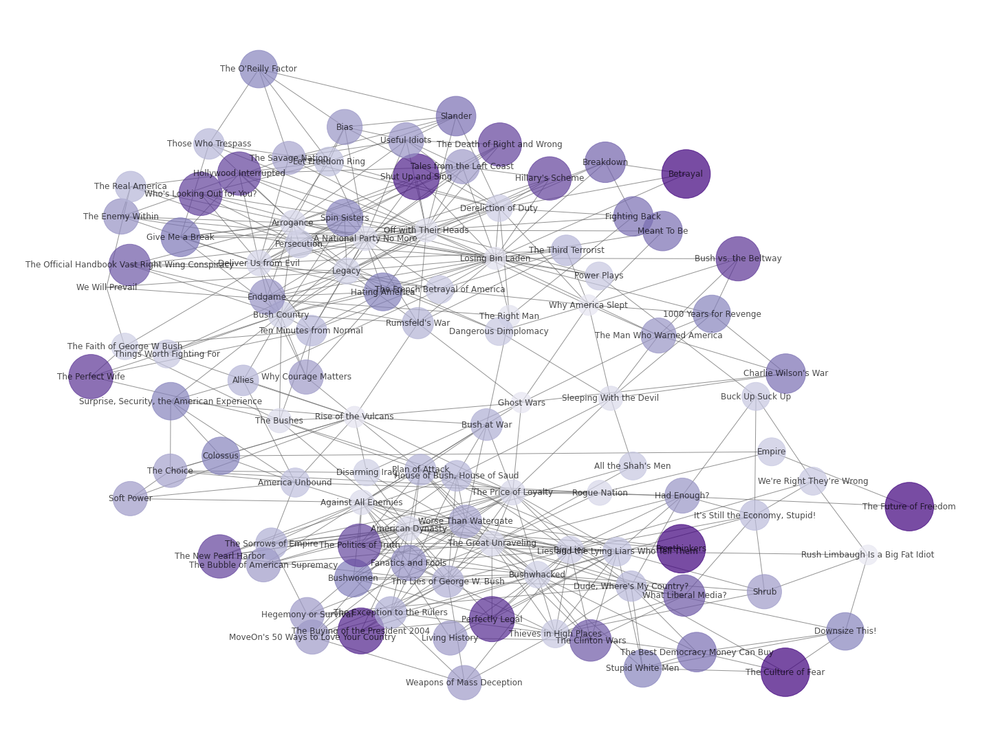

In [30]:
#lets plot the network where the nodes have the color which depends on the Clustering coefficient
np.random.seed(34)
plt.figure(figsize=(20,15))
node_color4 = listclust
nodesize4=[5000*v for v in listclust]
nx.draw_kamada_kawai(G, node_size=nodesize4 , node_color=node_color4, alpha=0.7, with_labels=True, edge_color='0.4', cmap=plt.cm.Purples)

top10clustcoe=get_top_keys(df, 'Clustering coefficient', 10)
print('Top 10 by Clustering coefficient ', top10clustcoe) 

Here we find 4 books in first position: "The Future of Freedom", "The Culture of Fear", "Betrayal", "Freethinkers", while, again from the graph, we can see that the nodes positioned in the perimeter of the figure have the greatest coefficient.

In [31]:
df_Cluc = df.sort_values('Clustering coefficient', ascending=False).head(10)
fig = px.bar(df_Cluc, x = 'node', y = 'Clustering coefficient',color='Clustering coefficient' , color_continuous_scale=px.colors.sequential.Purples)
fig.show()

In order to corroborate our analysis and to better understand and expose the functioning of the algorithm, we went to search if some of the books in our dataset were present in some of the best-selling book rankings. In fact, going to consult this site (https://pop-culture.us/Books/2004.phpk), in which we found the past rankings relating to book sales for 2004, we found three books that actually were in the top ten of New York Times Bestsellers 2004. These books are:
1) The Price of Loyalty by Ron Suskind: degree (20), betweenes centrality (747.045), degree centrality (0.192), closeness centrality (0.414), Eigenvector centrality (0.258).

2) Plan of Attack by Bob Woodward: betweenes centrality (430.097), closeness centrality (0.396), Eigenvector centrality (0.198).

3) Against All Enemies: Eigenvector centrality (0.186).

From this we can see how effectively one or more of these statistical values for each book can function as a tool to understand, in our case,  if abook has been more sold or influential, and if it had had a greater or lesser impact in the political debate of that year.

## <p>4. Using Plotly to create graph and detectes communities<p>

    
We then decided to conduct an analysis of the predictive capabilities of the Modularity Optimization algorithm by applying it to our graph. We realised some new graphs using plotly, more specifically the function defined by the professor "draw_plotly_network" (and obviously the sub defined function "set_layout", "set_trace" and "set_traces"). We create the communities, as said before, using a networkx algorithm, the "greedy_modularity_communities" imported from "networkx.algorithms" as "community".    

* Here we inserted the defined fuctions "set_layout", "set_trace" and "set_traces", "draw_plotly_network" they are foundamental in order to create the Graphs. We adjusted some of the style's parameters.

In [32]:
#We inserted the defined function created by the professor in order to create our plots with plotly 

edge_style_def = dict(color = 'gray', width = 0.5)  # define the default style for edges
node_style_def = dict(symbol = 'circle', size = 8, opacity = 0.9, 
                      color = 'blue', line = dict(color = 'rgb(0,0,0)', width = 0.5))   # define the default style for nodes


def set_layout(G, ndim = 2, kamada = True):    
    print('Calculating coordinates')
    layout = nx.kamada_kawai_layout(G, dim = ndim) if kamada else nx.spring_layout(G, dim = ndim) # define the node layout with NetworkX
    print('End')
    edgelist = list(G.edges())
    
    # Extract coordinates
    ax_nodes = pd.DataFrame(layout).transpose() 
    ax_nodes.columns = ['X', 'Y'] if ndim == 2 else ['X', 'Y', 'Z'] # 2D or 3D?
    
    
    # define layout for edges
    if ndim == 2:
        layout_e = dict(map(lambda e: 
                (e, # edge key
                ([layout[e[0]][0], layout[e[1]][0], None],  # X
                [layout[e[0]][1], layout[e[1]][1], None])  # Y
                ), edgelist))
    else:
        layout_e = dict(map(lambda e: 
            (e, # edge key
            ([layout[e[0]][0], layout[e[1]][0], None], # X
            [layout[e[0]][1], layout[e[1]][1], None],  # Y
            [layout[e[0]][2], layout[e[1]][2], None])  # Z
            ), edgelist))
    
    
    # extract coordinates
    ax_edges = pd.DataFrame(layout_e).transpose()
    ax_edges.columns = ['X', 'Y'] if ndim == 2 else ['X', 'Y', 'Z']

    return ax_nodes, ax_edges

def set_trace(X, Y, kind, style, name, Z = None, text = None): #draw nodes or edges
    mode = 'markers' if kind == 'node' else 'lines'
    hoverinfo = 'text' if kind == 'node' else 'none'
    if Z is None:
        if kind == 'node':
            return go.Scatter(x = X, y = Y, mode = mode, name = name, marker = style, text = text, hoverinfo = hoverinfo)  # draw nodes (i.e., markers) in 2D
        else:
            return go.Scatter(x = X, y = Y, mode = mode, name = name, line = style, text = text, hoverinfo = hoverinfo)  # draw edges (i.e., lines) in 2D
    else: 
        if kind == 'node':
            return go.Scatter3d(x = X, y = Y, z = Z, mode = mode, marker = style,  text = text, name = name, hoverinfo = hoverinfo)  # draw nodes (i.e., markers) in 3D
        else:
            return go.Scatter3d(x = X, y = Y, z = Z, mode = mode, line = style,  text = text, name = name, hoverinfo = hoverinfo)  # draw edges (i.e., lines) in 3D

    
def set_traces(nodes_ax: pd.DataFrame, edges_ax: pd.DataFrame, communities = None):  # Function to set up the main figure with nodes, edges, and communities
    traces = []
    Xe = list(chain(*edges_ax.X.tolist())) 
    Ye = list(chain(*edges_ax.Y.tolist()))
    Ze = list(chain(*edges_ax.Z.tolist())) if 'Z' in edges_ax.columns else None

    traces.append(set_trace(Xe, Ye, Z = Ze, kind = 'edge', style = edge_style_def, name = 'Link'))
    
    if communities is None:
        traces.append(set_trace(nodes_ax.X.tolist(), nodes_ax.Y.tolist(), 
                                Z = nodes_ax.Z.tolist() if 'Z' in nodes_ax.columns else None, 
                                kind = 'node', style = node_style_def, 
                                name = 'Character', text = nodes_ax.index))
    else:
        colors = list(sns.color_palette(n_colors =len(communities)).as_hex())
        for idcom, community in enumerate(communities):
            node_style = node_style_def.copy()
            node_style['color'] = colors[idcom]
            temp = nodes_ax[nodes_ax.index.isin(community)]
            traces.append(set_trace(temp.X.tolist(), temp.Y.tolist(), 
                                Z = temp.Z.tolist() if 'Z' in temp.columns else None, 
                                kind = 'node', style = node_style, 
                                name = 'Class '+str(idcom), text = temp.index))
            
                                       
    return traces

def draw_plotly_network(net, ndim = 2, communities = None, kamada = True):  # Main function to draw a network
    nodes_ax, edges_ax = set_layout(net, ndim = ndim, kamada = kamada)  # the kamada parameter sets the Networkx layout to use. The ndim parameter sets the dimensions the layout (i.e., 2D or 3D)
    traces = set_traces(nodes_ax, edges_ax, communities)  # the kamada parameter set the Networkx layout to use.
    pyo.iplot(traces, filename = 'basic-line')  # Plot the the network

* We plotted a 2D graph using the Kamada-Kawai-layout to test the function. 

In [33]:
#lets plot the graph with kawai using the defined 
np.random.seed(34)
draw_plotly_network(G)

Calculating coordinates
End


* We detected the communities using the algorithm and created a list for each one of the four identified commuinity.

In [34]:
# Detect communities using a Modularity Optimization algorithm
comm_mod = community.greedy_modularity_communities(G) 
#We decide to esxtract the data about the four comunity created by the algorithm and create a dataframe for each one 
#creating the list to use in the function
class0=[]
class1=[]
class2=[]
class3=[]
l=[class0, class1, class2, class3]
for i  in range(4):
    a=comm_mod[i]
    for j in range(len(a)):
        b=list(a)
        c=b[j]
        l[i].append(c)    
print(l)    

[['Dangerous Dimplomacy', 'Fighting Back', 'The Right Man', 'Ghost Wars', 'Meant To Be', "Who's Looking Out for You?", 'Betrayal', 'Ten Minutes from Normal', 'Tales from the Left Coast', 'Hating America', 'Legacy', 'The French Betrayal of America', 'Losing Bin Laden', 'Why America Slept', 'Hollywood Interrupted', 'The Savage Nation', 'Off with Their Heads', 'The Official Handbook Vast Right Wing Conspiracy', 'The Death of Right and Wrong', 'Sleeping With the Devil', 'Endgame', '1000 Years for Revenge', 'Those Who Trespass', 'Spin Sisters', "Hillary's Scheme", 'Slander', 'Bush Country', "Charlie Wilson's War", 'Breakdown', 'Give Me a Break', 'Dereliction of Duty', 'Useful Idiots', "The O'Reilly Factor", "Rumsfeld's War", 'A National Party No More', 'The Third Terrorist', 'Let Freedom Ring', 'Persecution', 'Power Plays', 'Arrogance', 'Bush vs. the Beltway', 'Deliver Us from Evil', 'Why Courage Matters', 'The Enemy Within', 'Shut Up and Sing', 'The Real America', 'We Will Prevail', 'Bias'

* Divided the books in lists according to the political alignment.

In [35]:
#creating a list composed by all communities organized for each value
listc=[]
listl=[]
listn=[]
for i in listnode:
    if df['values'][i]=='c':
        listc.append(i)
    elif df['values'][i]=='l':
        listl.append(i)
    else:
        listn.append(i)
listpolmov=[listc, listl, listn]
dictpolmov={'neutral':listn, 'liberal':listl, 'conservative':listc}
print(dictpolmov)

{'neutral': ['1000 Years for Revenge', 'Sleeping With the Devil', 'Why America Slept', 'Ghost Wars', 'Meant To Be', "All the Shah's Men", 'Power Plays', 'The Perfect Wife', 'Surprise, Security, the American Experience', 'Colossus', 'Plan of Attack', 'The Future of Freedom', 'Empire'], 'liberal': ['The Price of Loyalty', 'House of Bush, House of Saud', 'Downsize This!', 'Stupid White Men', 'Rush Limbaugh Is a Big Fat Idiot', 'The Best Democracy Money Can Buy', 'The Culture of Fear', 'America Unbound', 'The Choice', 'The Great Unraveling', 'Rogue Nation', 'Soft Power', 'The Sorrows of Empire', 'Against All Enemies', 'American Dynasty', 'Big Lies', 'The Lies of George W. Bush', 'Worse Than Watergate', 'The New Pearl Harbor', 'Bushwomen', 'The Bubble of American Supremacy', 'Living History', 'The Politics of Truth', 'Fanatics and Fools', 'Bushwhacked', 'Disarming Iraq', 'Lies and the Lying Liars Who Tell Them', "MoveOn's 50 Ways to Love Your Country", 'The Buying of the President 2004', 'P

* We have drawn two graphs: the first in 2D and the second in 3D 

In [36]:
draw_plotly_network(G, communities = l) 
draw_plotly_network(G, ndim = 3, communities =l)

Calculating coordinates
End


Calculating coordinates
End


* We modifed the already used function in order to display our colors on the graphs.

In [37]:
#We modified the function of the professor in order to create the plots with our community with plotly 

edge_style_def = dict(color = 'gray', width = 0.5)  # define the default style for edges
node_style_def = dict(symbol = 'circle', size = 8, opacity = 0.9, 
                      color = 'blue', line = dict(color = 'rgb(0,0,0)', width = 0.5))   # define the default style for nodes




def set_layout(G, ndim = 2, kamada = True):    
    print('Calculating coordinates')
    layout = nx.kamada_kawai_layout(G, dim = ndim) if kamada else nx.spring_layout(G, dim = ndim) # define the node layout with NetworkX
    print('End')
    edgelist = list(G.edges())
    
    # Extract coordinates
    ax_nodes = pd.DataFrame(layout).transpose() 
    ax_nodes.columns = ['X', 'Y'] if ndim == 2 else ['X', 'Y', 'Z'] # 2D or 3D?
    
    
    # define layout for edges
    if ndim == 2:
        layout_e = dict(map(lambda e: 
                (e, # edge key
                ([layout[e[0]][0], layout[e[1]][0], None],  # X
                [layout[e[0]][1], layout[e[1]][1], None])  # Y
                ), edgelist))
    else:
        layout_e = dict(map(lambda e: 
            (e, # edge key
            ([layout[e[0]][0], layout[e[1]][0], None], # X
            [layout[e[0]][1], layout[e[1]][1], None],  # Y
            [layout[e[0]][2], layout[e[1]][2], None])  # Z
            ), edgelist))
    
    
    # extract coordinates
    ax_edges = pd.DataFrame(layout_e).transpose()
    ax_edges.columns = ['X', 'Y'] if ndim == 2 else ['X', 'Y', 'Z']

    return ax_nodes, ax_edges

def set_trace(X, Y, kind, style, name, Z = None, text = None): #draw nodes or edges
    mode = 'markers' if kind == 'node' else 'lines'
    hoverinfo = 'text' if kind == 'node' else 'none'
    if Z is None:
        if kind == 'node':
            return go.Scatter(x = X, y = Y, mode = mode, name = name, marker = style, text = text, hoverinfo = hoverinfo)  # draw nodes (i.e., markers) in 2D
        else:
            return go.Scatter(x = X, y = Y, mode = mode, name = name, line = style, text = text, hoverinfo = hoverinfo)  # draw edges (i.e., lines) in 2D
    else: 
        if kind == 'node':
            return go.Scatter3d(x = X, y = Y, z = Z, mode = mode, marker = style,  text = text, name = name, hoverinfo = hoverinfo)  # draw nodes (i.e., markers) in 3D
        else:
            return go.Scatter3d(x = X, y = Y, z = Z, mode = mode, line = style,  text = text, name = name, hoverinfo = hoverinfo)  # draw edges (i.e., lines) in 3D

    
def set_traces(nodes_ax: pd.DataFrame, edges_ax: pd.DataFrame, communities = None):  # Function to set up the main figure with nodes, edges, and communities
    traces = []
    Xe = list(chain(*edges_ax.X.tolist())) 
    Ye = list(chain(*edges_ax.Y.tolist()))
    Ze = list(chain(*edges_ax.Z.tolist())) if 'Z' in edges_ax.columns else None

    traces.append(set_trace(Xe, Ye, Z = Ze, kind = 'edge', style = edge_style_def, name = 'Link'))
    
    if communities is None:
        traces.append(set_trace(nodes_ax.X.tolist(), nodes_ax.Y.tolist(), 
                                Z = nodes_ax.Z.tolist() if 'Z' in nodes_ax.columns else None, 
                                kind = 'node', style = node_style_def, 
                                name = 'Character', text = nodes_ax.index))
    else:
        labels=['conservative','liberal','neutral'] # modified for  us
        colors = ['red', 'blue','grey'] # modified for us
        for idcom, community in enumerate(communities):
            node_style = node_style_def.copy()
            node_style['color'] = colors[idcom]
            temp = nodes_ax[nodes_ax.index.isin(community)]
            traces.append(set_trace(temp.X.tolist(), temp.Y.tolist(), 
                                Z = temp.Z.tolist() if 'Z' in temp.columns else None, 
                                kind = 'node', style = node_style, 
                                name = 'Class '+str(labels[idcom]), text = temp.index))
            
                                       
    return traces

def draw_plotly_network_modded(net, ndim = 2, communities = None, kamada = True):  # Main function to draw a network
    nodes_ax, edges_ax = set_layout(net, ndim = ndim, kamada = kamada)  # the kamada parameter sets the Networkx layout to use. The ndim parameter sets the dimensions the layout (i.e., 2D or 3D)
    traces = set_traces(nodes_ax, edges_ax, communities)  # the kamada parameter set the Networkx layout to use.
    pyo.iplot(traces, filename = 'basic-line')  # Plot the the network

In [38]:
draw_plotly_network_modded(G, ndim = 2, communities = listpolmov)
draw_plotly_network_modded(G, ndim = 3, communities = listpolmov)

Calculating coordinates
End


Calculating coordinates
End


Comparing the graphs we can see a very strong similarity in the disposition of the communities: in fact if we consider class2 and class3 as a single class the dispositions seem to be almost the same. In the next part we will proceed to compare the results obtained by the algorithm.

## <p>5. Comparing the algorithm with our data<p>
<p> In this part we have therefore compared and tested the results of the algorithm: to do this, we took the communities created by the algorithm and compared them with our 3 (liberal, conservative and neutral). In order to calculate the accuracy rate of the algorithm, we first paired the communities based on graphical similarities obtained by comparing the graphs. Then we took the number of books in common between the two communities and we divided it by the number of books in the community determined by the political alignment.

<p><b>a)</b> In the first case we can observe an accuracy of 87.75 as numerous books have been found in both categories.

In [39]:
#conservatives vs class0

list1 = class0
list2 = listc
print('Number of books in class0: ', len(list1))
print('Number of books that are conservative: ', len(list2))
print('')
set1 = set(list1)
set2 = set(list2)
set3 = set1 & set2
list3 = list(set3)
print('Libri in comune: ', list3) 
print('')
print('Number of shared books: ', len(list3))
print("The accuracy is: ", str(len(list3)/len(list2)*100)+"%")

Number of books in class0:  49
Number of books that are conservative:  49

Libri in comune:  ['Fighting Back', 'The Right Man', 'Dangerous Dimplomacy', "Who's Looking Out for You?", 'Betrayal', 'Ten Minutes from Normal', 'Tales from the Left Coast', 'Legacy', 'Hating America', 'The French Betrayal of America', 'Losing Bin Laden', 'Hollywood Interrupted', 'The Savage Nation', 'Off with Their Heads', 'The Death of Right and Wrong', 'The Official Handbook Vast Right Wing Conspiracy', 'Endgame', 'Those Who Trespass', 'Spin Sisters', "Hillary's Scheme", 'Slander', 'Bush Country', "Charlie Wilson's War", 'Breakdown', 'Dereliction of Duty', 'Give Me a Break', 'Useful Idiots', "The O'Reilly Factor", "Rumsfeld's War", 'A National Party No More', 'The Third Terrorist', 'Let Freedom Ring', 'Persecution', 'Arrogance', 'Bush vs. the Beltway', 'Deliver Us from Evil', 'Why Courage Matters', 'The Enemy Within', 'Shut Up and Sing', 'The Real America', 'We Will Prevail', 'Bias', 'The Man Who Warned Amer

In [40]:
leng=[len(class0), len(listc), len(list3)]
index=['class 0', 'conservatives', 'shared books']
data={'community': index, 'number of books': leng}
df_r=pd.DataFrame(data=data)
print(df_r)

fig = px.bar(df_r, x = 'community', y = 'number of books', color='community' , color_discrete_sequence=px.colors.sequential.RdBu)
fig.show()

       community  number of books
0        class 0               49
1  conservatives               49
2   shared books               43


<p><b>b)</b> In the second case the accuracy increases up to 88.37 having even more books in common between the two.

In [41]:
#liberal vs class1

list1 = class1
list2 = listl
print('Number of books in class1: ', len(list1))
print('Number of books that are liberal: ', len(list2))
print(' ')
set1 = set(list1)
set2 = set(list2)
set3 = set1 & set2
list3 = list(set3)
print('Libri in comune: ', list3) 
print(' ')
print('Number of shared books: ', len(list3))
print("The accuracy is: ", str(len(list3)/len(list2)*100)+"%")

Number of books in class1:  41
Number of books that are liberal:  43
 
Libri in comune:  ['The Bubble of American Supremacy', 'The Politics of Truth', 'Bushwhacked', 'What Liberal Media?', 'Shrub', 'The Clinton Wars', "Dude, Where's My Country?", "MoveOn's 50 Ways to Love Your Country", 'The Great Unraveling', 'The Best Democracy Money Can Buy', 'Against All Enemies', 'The Sorrows of Empire', 'Lies and the Lying Liars Who Tell Them', 'House of Bush, House of Saud', 'The Culture of Fear', 'Rush Limbaugh Is a Big Fat Idiot', "We're Right They're Wrong", "It's Still the Economy, Stupid!", 'The New Pearl Harbor', 'Bushwomen', 'Worse Than Watergate', 'Stupid White Men', 'Living History', 'Weapons of Mass Deception', 'Had Enough?', 'Downsize This!', 'Hegemony or Survival', 'Freethinkers', 'American Dynasty', 'Buck Up Suck Up', 'Big Lies', 'The Lies of George W. Bush', 'Thieves in High Places', 'Perfectly Legal', 'The Exception to the Rulers', 'Fanatics and Fools', 'The Price of Loyalty', 'Th

In [42]:
leng=[len(class1), len(listl), len(list3)]
index=['class 1', 'liberal', 'shared books']
data={'community': index, 'number of books': leng}
df_r=pd.DataFrame(data=data)
print(df_r)

fig = px.bar(df_r, x = 'community', y = 'number of books', color='community' , color_discrete_sequence=px.colors.sequential.Turbo)
fig.show()

      community  number of books
0       class 1               41
1       liberal               43
2  shared books               38


<p><b>c)</b> In the third case, however, as was also easily imaginable, the accuracy drops drastically to 38.46. This is explainable by the fact that we have lesser components in these groups. In addition to this we can also note that we compared the neutral class with the two smallest groups created by the algorithm merged together.<p>

In [43]:
#neutral vs class2 and class3

list1 = class2+class3
list2 = listn
print('Number of books in class2 and 3: ', len(list1))
print('Number of books that are neutral: ', len(list2))
print('')
set1 = set(list1)
set2 = set(list2)
set3 = set1 & set2
list3 = list(set3)
print('Libri in comune: ', list3) 
print(' ')
print('Number of shared books: ', len(list3))
print(' ')
percentage=len(list3)/len(list2)*100
print("The accuracy is: ", str(percentage)+'%')

Number of books in class2 and 3:  15
Number of books that are neutral:  13

Libri in comune:  ['The Future of Freedom', 'The Perfect Wife', 'Surprise, Security, the American Experience', 'Empire', 'Colossus']
 
Number of shared books:  5
 
The accuracy is:  38.46153846153847%


In [44]:
leng=[len(class2+class3), len(listn), len(list3)]
index=['class 2 + class 3', 'neutral', 'shared books']
data={'community': index, 'number of books': leng}
df_r=pd.DataFrame(data=data)
print(df_r)

fig = px.bar(df_r, x = 'community', y = 'number of books', color='community' , color_discrete_sequence=px.colors.sequential.Greys)
fig.show()

           community  number of books
0  class 2 + class 3               15
1            neutral               13
2       shared books                5


* Here we decide to create a graphical representation of our foundings and in order to do so we created two version of the same graph, one with plotly and one with Networkx, where the nodes incorrectly assigned by the algorithm where colored green. For correctly identified nodes we used the previous three colors assigned to the polical aligment.

This part of the code is used to create the subdataframe and some usefull lists, for new values and colors.

In [45]:
df_conf=df.loc[:, ['node', 'values']]
algovalues=[]
classn=class2+class3


for i in df_conf['node']:
    if i in class0:
        algovalues.append('c')
    elif i in class1:
        algovalues.append('l')
    else:
        algovalues.append('n')
df_conf.insert(2,'algorithms values', algovalues)
df_conf    


incorrect, correctc, correctl, correctn= [], [], [], []
groups4color=[incorrect, correctc, correctl, correctn]
newcolors=[]
for i in df_conf['node']:
    if df_conf['values'][i]!= df_conf['algorithms values'][i]:
        incorrect.append(i)
        newcolors.append('green')
    else:
        if df_conf['values'][i]=='l':
            correctl.append(i)
            newcolors.append('blue')
        elif df_conf['values'][i]=='c':
            correctc.append(i)
            newcolors.append('red')
        else:
            correctn.append(i)
            newcolors.append('lightgrey')



here we once again used a mpdified version of the defined function

In [46]:
edge_style_def = dict(color = 'gray', width = 0.5)  # define the default style for edges
node_style_def = dict(symbol = 'circle', size = 8, opacity = 0.9, 
                      color = 'blue', line = dict(color = 'rgb(0,0,0)', width = 0.5))   # define the default style for nodes




def set_layout(G, ndim = 2, kamada = True):    
    print('Calculating coordinates')
    layout = nx.kamada_kawai_layout(G, dim = ndim) if kamada else nx.spring_layout(G, dim = ndim) # define the node layout with NetworkX
    print('End')
    edgelist = list(G.edges())
    
    # Extract coordinates
    ax_nodes = pd.DataFrame(layout).transpose() 
    ax_nodes.columns = ['X', 'Y'] if ndim == 2 else ['X', 'Y', 'Z'] # 2D or 3D?
    
    
    # define layout for edges
    if ndim == 2:
        layout_e = dict(map(lambda e: 
                (e, # edge key
                ([layout[e[0]][0], layout[e[1]][0], None],  # X
                [layout[e[0]][1], layout[e[1]][1], None])  # Y
                ), edgelist))
    else:
        layout_e = dict(map(lambda e: 
            (e, # edge key
            ([layout[e[0]][0], layout[e[1]][0], None], # X
            [layout[e[0]][1], layout[e[1]][1], None],  # Y
            [layout[e[0]][2], layout[e[1]][2], None])  # Z
            ), edgelist))
    
    
    # extract coordinates
    ax_edges = pd.DataFrame(layout_e).transpose()
    ax_edges.columns = ['X', 'Y'] if ndim == 2 else ['X', 'Y', 'Z']

    return ax_nodes, ax_edges

def set_trace(X, Y, kind, style, name, Z = None, text = None): #draw nodes or edges
    mode = 'markers' if kind == 'node' else 'lines'
    hoverinfo = 'text' if kind == 'node' else 'none'
    if Z is None:
        if kind == 'node':
            return go.Scatter(x = X, y = Y, mode = mode, name = name, marker = style, text = text, hoverinfo = hoverinfo)  # draw nodes (i.e., markers) in 2D
        else:
            return go.Scatter(x = X, y = Y, mode = mode, name = name, line = style, text = text, hoverinfo = hoverinfo)  # draw edges (i.e., lines) in 2D
    else: 
        if kind == 'node':
            return go.Scatter3d(x = X, y = Y, z = Z, mode = mode, marker = style,  text = text, name = name, hoverinfo = hoverinfo)  # draw nodes (i.e., markers) in 3D
        else:
            return go.Scatter3d(x = X, y = Y, z = Z, mode = mode, line = style,  text = text, name = name, hoverinfo = hoverinfo)  # draw edges (i.e., lines) in 3D

    
def set_traces(nodes_ax: pd.DataFrame, edges_ax: pd.DataFrame, communities = None):  # Function to set up the main figure with nodes, edges, and communities
    traces = []
    Xe = list(chain(*edges_ax.X.tolist())) 
    Ye = list(chain(*edges_ax.Y.tolist()))
    Ze = list(chain(*edges_ax.Z.tolist())) if 'Z' in edges_ax.columns else None

    traces.append(set_trace(Xe, Ye, Z = Ze, kind = 'edge', style = edge_style_def, name = 'Link'))
    
    if communities is None:
        traces.append(set_trace(nodes_ax.X.tolist(), nodes_ax.Y.tolist(), 
                                Z = nodes_ax.Z.tolist() if 'Z' in nodes_ax.columns else None, 
                                kind = 'node', style = node_style_def, 
                                name = 'Character', text = nodes_ax.index))
    else:
        labels=['incorrect', 'conservative', 'liberal', 'neutral'] # modified for  us
        colors = ['green', 'red', 'blue', 'lightgrey'] # modified for us
        for idcom, community in enumerate(communities):
            node_style = node_style_def.copy()
            node_style['color'] = colors[idcom]
            temp = nodes_ax[nodes_ax.index.isin(community)]
            traces.append(set_trace(temp.X.tolist(), temp.Y.tolist(), 
                                Z = temp.Z.tolist() if 'Z' in temp.columns else None, 
                                kind = 'node', style = node_style, 
                                name = str(labels[idcom]), text = temp.index))
            
                                       
    return traces

def draw_plotly_network_modded(net, ndim = 2, communities = None, kamada = True):  # Main function to draw a network
    nodes_ax, edges_ax = set_layout(net, ndim = ndim, kamada = kamada)  # the kamada parameter sets the Networkx layout to use. The ndim parameter sets the dimensions the layout (i.e., 2D or 3D)
    traces = set_traces(nodes_ax, edges_ax, communities)  # the kamada parameter set the Networkx layout to use.
    pyo.iplot(traces, filename = 'basic-line')  # Plot the the network

Here we draw our plots, with plotly and Networkx

In [47]:
draw_plotly_network(G, communities = groups4color) 

Calculating coordinates
End


green = incorrect
blue = correct liberals
red = correct conservative
grey = correct neutral


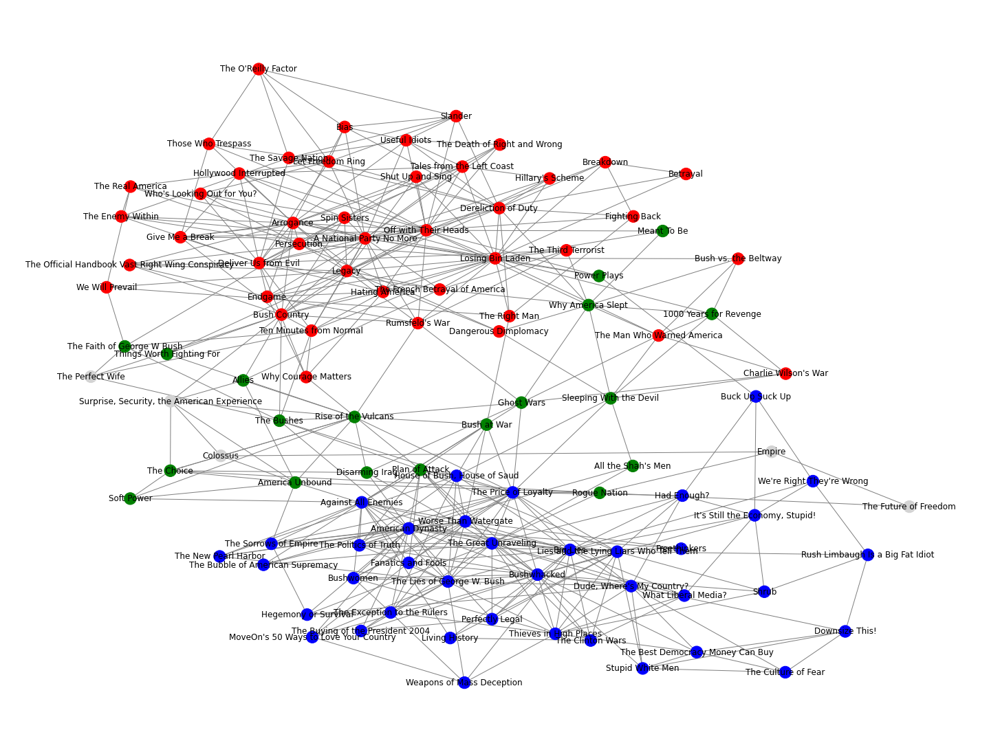

In [48]:
np.random.seed(34)
plt.figure(figsize=(20,15))
print('green = incorrect')
print('blue = correct liberals')
print('red = correct conservative')
print('grey = correct neutral')
nx.draw_kamada_kawai(G, with_labels=True, node_color = newcolors,  edge_color = "grey")
plt.show()

Finally we calculated the total accuracy rate of the algorith comparing the correctly assigned nodes with the total number.

In [49]:
Total_accuracy_rate= (105-len(incorrect))/105
print('the total accuracy rate of the algorithm is: '+ str(Total_accuracy_rate*100) + '%')
print('the number of inccorrect elements is: ', len(incorrect))

the total accuracy rate of the algorithm is: 81.9047619047619%
the number of inccorrect elements is:  19


throught our analysis after the preliminar data extraction, cleaning and preparation, we have analized our graph tring to look at various indicators. difatti abbiamo scoperto che confrontando i libri con i valori dei nodi più alti con la classifica del new york times dei 10 libri più influenti abbiamo trovato ben 3 libri presenti al suo interno. purtroppo a causa della limitatezza dei dati disponibili online non abbiamo potuto fare maggiori confronti. possiamo però affermare che utilizzando certi parametri dei grafi possiamo avere un'idea chiara di quali siano stati i libri più influenti per ogni political group.
inoltre abbiamo anche deciso di condurre una analisi dell'efficacia di previsione delle comunità da parte dell'algoritmo e abbiamo scoperto che esso ha una precisione generale  dell' 82% e per le singole classi abbiamo invece: 38.5% per i neutri, 88.4% per i liberali e infine 87.8% per i conservatori. Da ciò possiamo affermare che (salvo per il gruppo dei neutri) questo algoritmo è capace di identificare communità naturali con una buona percentuale di successo, soprattutto se queste counità presentano un alto grado di divisione e polarizzazione.


We would like to thank Professor V. Krebs for compiling this graph.